# (04) fit — iterative pvae

**Motivation**: host = ```mach```, device = ```cuda:0``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
# sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
sys.path.insert(0, os.path.join(git_dir, '_IterativeVAE'))
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from base.utils_model import load_quick
from figures.analysis import plot_convergence
from figures.imgs import plot_weights

device_idx = 0
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:0  ———  host: mach

## BALLS64

### Get configs

In [3]:
model_type = 'poisson'
cfg_vae, cfg_tr = default_configs('BALLS16', model_type, 'jacob|lin')

cfg_vae['n_latents'] = [16 * 2]
cfg_vae['init_scale'] = 1e-2
cfg_vae['seq_len'] = 16

cfg_tr['lr'] = 2e-3
cfg_tr['epochs'] = 1000
cfg_tr['batch_size'] = 512
cfg_tr['kl_beta'] = 16.0
cfg_tr['kl_balancer'] = 'equal'

print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'BALLS16', 'n_latents': [32], 'prior_clamp': -4, 'enc_type': 'jacob', 'dec_type': 'lin', 'enc_bias': 
False, 'dec_bias': False, 'init_dist': 'normal', 'init_scale': 0.01, 'seq_len': 16}

Trainer:
{'epochs': 1000, 'batch_size': 512, 'optimizer_kws': {'weight_decay': 0.0001}, 'grad_clip': 250, 
'kl_const_portion': 0.0, 'lr': 0.002, 'kl_beta': 16.0, 'kl_balancer': 'equal'}

### Make model + trainer

In [4]:
vae = HIPVAE(CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

### Print info

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|    HIPVAE   |   8.3 K    |
|     ———     |    ———     |
|  layers.L_0 |   8.3 K    |
+-------------+------------+

poisson_uniform_c(-4)_BALLS16_t-16_z-[32]_k-32_<jacob|lin>
mc_b512-ep1000-lr(0.002)_beta(16:0x0.5)_temp(0.05:lin-0.5)_gr(250)_(2024_09_04,09:34)

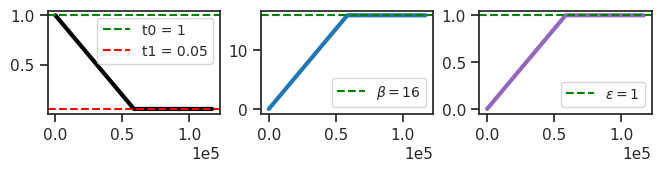

In [5]:
vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

In [6]:
tr.n_iters

117000

In [7]:
print_num_params(tr.model.input_layer)

+--------------+------------+
| Module Name  | Num Params |
+--------------+------------+
| PoissonLayer |   8.3 K    |
|     ———      |    ———     |
|    fc_dec    |   8.2 K    |
+--------------+------------+

In [8]:
print(tr.model.input_layer.dec)

None

### Fit model

In [ ]:
tr.train()

epoch # 822, avg loss: 4.002154:  82%|██████████████████████████████████████████████          | 822/1000 [1:40:36<24:08,  8.14s/it]

In [ ]:
tr.model.show(nrows=4);

In [ ]:
results = tr.analysis(10000, verbose=True)

In [ ]:
_ = plot_convergence(results)

In [ ]:
results_tst = tr.analysis(10000, dl_name='tst', verbose=True)

In [ ]:
_ = plot_convergence(results_tst)

In [ ]:
data, loss, etc = tr.validate(full_data=True)
kl_diag = loss['kl_diag'].copy()
loss = {
    k: np.mean(v, 0) for k, v in
    loss.items() if k != 'kl_diag'
}
print(loss)

In [ ]:
sample_i = 100

shape = (tr.model.cfg.input_sz, ) * 2
ncols = 1 + tr.model.cfg.seq_len
fig, axes = create_figure(1, ncols, (0.97 * ncols, 1.3), 'all', 'all')

ax = axes[0]
x2p = data['x'][sample_i, 0]
kws = dict(vmin=x2p.min(), vmax=x2p.max(), cmap='Greys_r')
ax.imshow(x2p, **kws)
ax.set_title('input img')

for t in range(tr.model.cfg.seq_len):
    ax = axes[t + 1]
    ax.imshow(data['y'][sample_i, t].reshape(shape), **kws)
    ax.set_title(f"t = {t}")
remove_ticks(axes[1:])
ax_square(axes);

In [ ]:
log_rate = tonp(tr.model.input_layer.log_rate).ravel()
bias = tonp(tr.model.input_layer.bias).ravel()

fig, axes = create_figure(1, 2, (10, 2))
kws = dict(fill=True, lw=3, alpha=0.3, ax=axes[0])
sns.histplot(log_rate, color='C0', element='step', label=r'$\log r$', **kws)

kws = dict(fill=True, lw=3, alpha=0.3, ax=axes[1])
sns.histplot(np.exp(log_rate), color='C0', element='step', label='rate', **kws)
sns.histplot(bias, color='C8', element='step', label='bias', **kws)

axes[1].set(ylabel='')
add_legend(axes)

plt.show()

## Load mod?

In [5]:
model_name = 'poisson_uniform_c(-2)_MNIST_t-20_z-[128]_k-32_<jac|mlp+b>'
fit_name = 'mc_b200-ep500-lr(0.002)_beta(10:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_09_02,00:26)'
tr, meta = load_model(model_name=model_name, fit_name=fit_name, device=device)

In [6]:
print(tr.cfg.kl_balancer)

None

In [15]:
data, loss, etc = tr.validate(full_data=True)

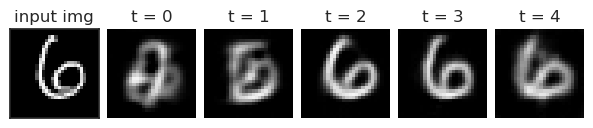

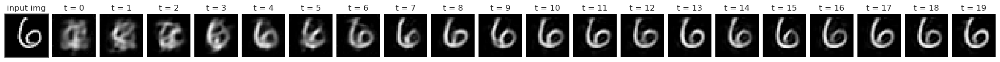

### Analysis

In [10]:
results = tr.analysis(5000, verbose=True)

100%|█████████████████████████████████| 50/50 [13:51<00:00, 16.63s/it]


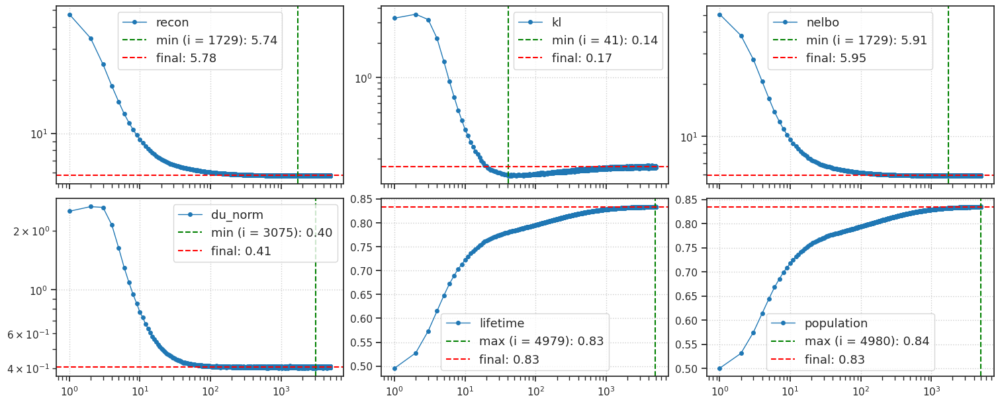

In [12]:
from figures.analysis import plot_convergence
plot_convergence(results)

### generate

In [13]:
self = tr.model.input_layer
self.reset_state(64)

dist, z, pred = self.generate(0.0)

output = tr.model.generate(pred, seq=range(300))
output = output.stack()

loss_kl = tonp(torch.sum(output['loss_kl'], -1))
u = tr.model.input_layer.log_rate.expand(len(pred), -1)
desc_len = tr.model.input_layer.loss_kl(u=u)
desc_len = tonp(torch.sum(desc_len, dim=-1))

list(output)

['recon', 'ff', 'fb', 'spks', 'dist', 'loss_kl', 'loss_recon']

In [14]:
shape = (tr.model.cfg.input_sz, tr.model.cfg.input_sz)

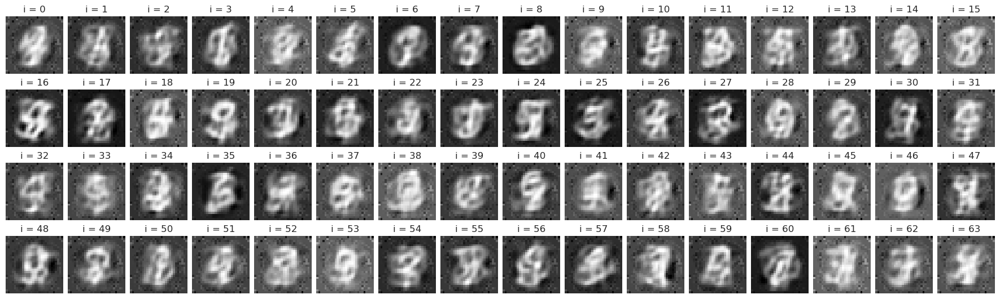

In [15]:
nrows = 4
ncols = int(np.ceil(len(pred) / nrows))
fig, axes = create_figure(nrows, ncols, (1.1 * ncols, 1.3 * nrows), 'all', 'all')
for sample_i, ax in enumerate(axes.flat):
    i, j = sample_i // ncols, sample_i % ncols
    x2p = tonp(pred[sample_i].reshape(shape))
    ax.imshow(x2p, cmap='Greys_r')
    ax.set_title(f"i = {sample_i}")
trim_axs(axes, len(pred))
remove_ticks(axes)
plt.show()

In [16]:
sample_i = 30

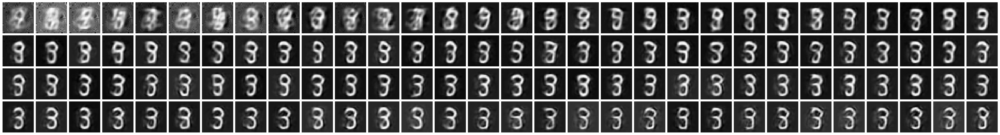

In [17]:
nrows, ncols = 4, 30
fig, axes = create_figure(nrows, ncols, (1.3 * ncols, 1.3 * nrows), 'all', 'all')
for idx, ax in enumerate(axes.flat):
    i, j = idx // ncols, idx % ncols
    x2p = tonp(output['recon'][sample_i, idx].reshape(shape))
    ax.imshow(x2p, cmap='Greys_r')
remove_ticks(axes)

In [18]:
order = np.argsort(desc_len)

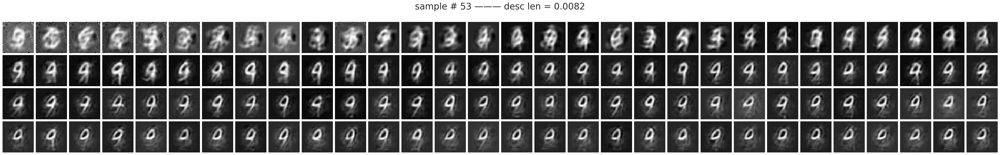

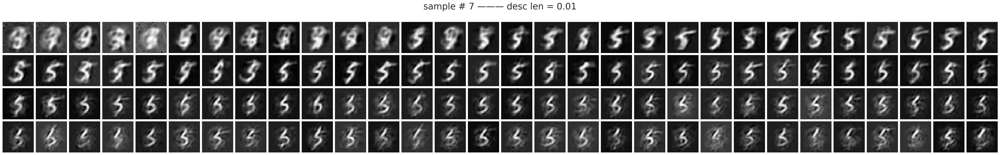

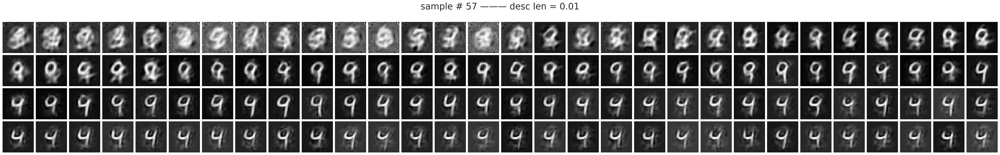

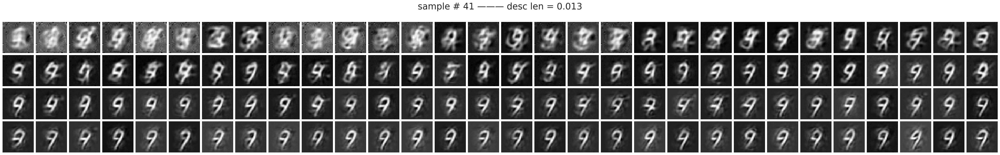

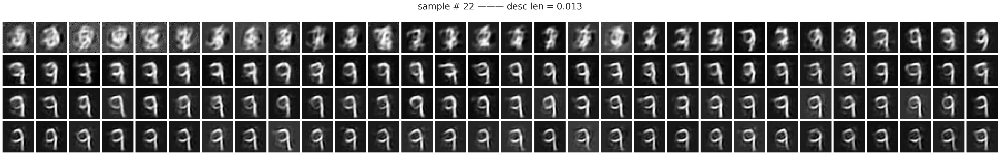

...

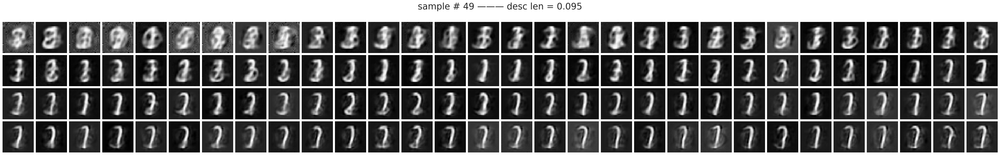

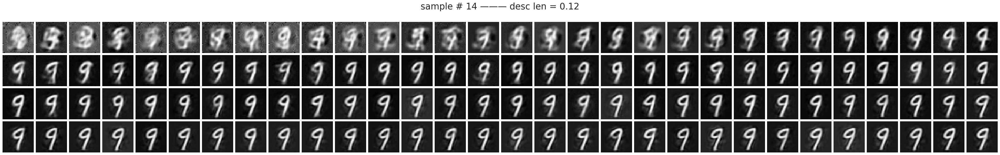

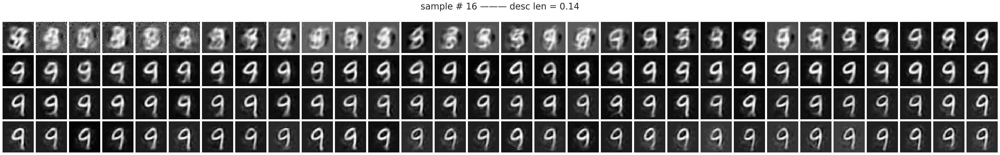

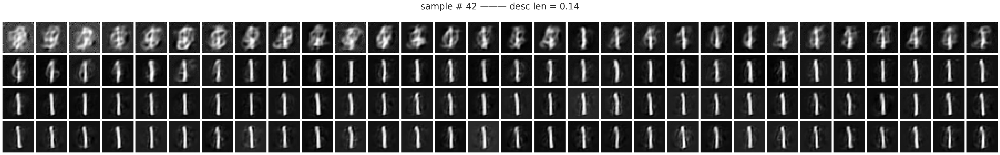

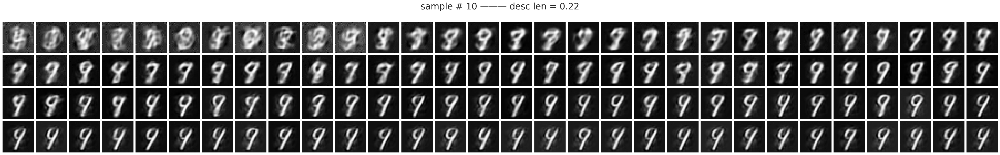

In [19]:
for i in range(len(pred)):
    sample_i = order[i]
    nrows, ncols = 4, 30
    fig, axes = create_figure(nrows, ncols, (1.3 * ncols, 1.3 * nrows), 'all', 'all')
    tit = ' ——— '.join([f"sample # {sample_i}", f"desc len = {desc_len[sample_i]:0.2g}"])
    fig.suptitle(tit, fontsize=25, y=1.14)
    
    x2p = tonp(pred[sample_i].reshape(shape))
    axes[0, 0].imshow(x2p, cmap='Greys_r')
    
    for idx, ax in enumerate(axes.flat[1:], start=1):
        i, j = idx // ncols, idx % ncols
        x2p = tonp(output['recon'][sample_i, idx - 1].reshape(28, 28))
        ax.imshow(x2p, cmap='Greys_r')
    remove_ticks(axes)
    plt.show()

In [20]:
list(output)

['recon', 'ff', 'fb', 'spks', 'dist', 'loss_kl', 'loss_recon']

In [21]:
du_norm = tonp(torch.linalg.vector_norm(
    output['ff'], dim=-1))

ff = tonp(output['ff'])
ff.shape

(64, 300, 128)

In [22]:
sample_i = 34

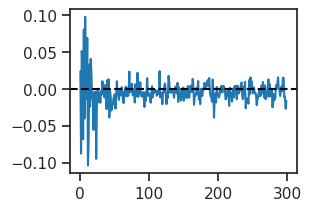

In [23]:
fig, ax = create_figure()
ax.plot(ff[sample_i, :, 27])
ax.axhline(0, color='k', ls='--')

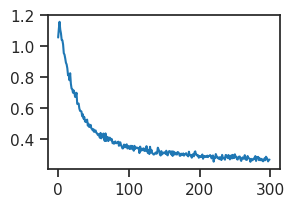

In [24]:
plt.plot(du_norm.mean(0))

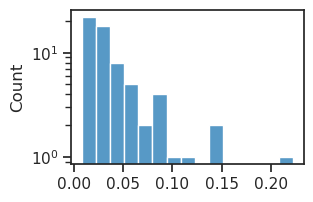

In [25]:
ax = sns.histplot(tonp(desc_len).ravel())
ax.set_yscale('log')